In [228]:
#M. Sohaib Haider_23l2519(BDS-3A)
#M. Abdullah Arshad_23l2531(BDS-3A)
#M. Awais_23l2618(BDS-3A)



import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix , classification_report
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.utils import resample
sns.set()

In [229]:
train = pd.read_csv("train.csv")

In [230]:
train

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,...,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


## Data Description

In [232]:
train.describe()

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,51951.500000,64924.210502,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,29994.645522,37463.812252,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25975.750000,32533.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,51951.500000,64856.500000,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,77927.250000,97368.250000,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [233]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         103904 non-null  int64  
 1   id                                 103904 non-null  int64  
 2   Gender                             103904 non-null  object 
 3   Customer Type                      103904 non-null  object 
 4   Age                                103904 non-null  int64  
 5   Type of Travel                     103904 non-null  object 
 6   Class                              103904 non-null  object 
 7   Flight Distance                    103904 non-null  int64  
 8   Inflight wifi service              103904 non-null  int64  
 9   Departure/Arrival time convenient  103904 non-null  int64  
 10  Ease of Online booking             103904 non-null  int64  
 11  Gate location                      1039

## Data Cleaning

### Dealing with Unwanted Columns

In [236]:
train

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,103899,94171,Female,disloyal Customer,23,Business travel,Eco,192,2,1,...,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,103900,73097,Male,Loyal Customer,49,Business travel,Business,2347,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,103901,68825,Male,disloyal Customer,30,Business travel,Business,1995,1,1,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,103902,54173,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


In [237]:
drop_train = train.drop(['Unnamed: 0', 'id'], axis=1)
drop_train

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,...,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


### Dealing with Duplicates

In [239]:
duplicates_exist = drop_train.duplicated().any()
print("Are there duplicates?:", duplicates_exist)
drop_train.drop_duplicates(inplace=True)

Are there duplicates?: False


In [240]:
#No duplicates in the data

### Dealing with Missing Values

In [242]:
drop_train.isnull().sum()

Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction                           0
dtype: int64

In [243]:
numerical_cols = drop_train.select_dtypes(include=np.number).columns
cleaned_data = drop_train.fillna(drop_train[numerical_cols].mean())


In [244]:
cleaned_data

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,...,2,3,1,4,2,3,2,3,0.0,neutral or dissatisfied
103900,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,...,5,5,5,5,5,5,4,0,0.0,satisfied
103901,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,...,4,3,2,4,5,5,4,7,14.0,neutral or dissatisfied
103902,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,...,1,4,5,1,5,4,1,0,0.0,neutral or dissatisfied


In [245]:
cleaned_data.isnull().sum()

Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

### Dimension Reduction

In [247]:

cleaned_data['Total Delay'] = cleaned_data['Arrival Delay in Minutes'] + cleaned_data['Departure Delay in Minutes']
cleaned_data.drop(columns = ['Arrival Delay in Minutes','Departure Delay in Minutes'],inplace = True)
cleaned_data

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,satisfaction,Total Delay
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,5,4,3,4,4,5,5,neutral or dissatisfied,43.0
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,1,5,3,1,4,1,neutral or dissatisfied,7.0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,5,4,3,4,4,4,5,satisfied,0.0
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,2,5,3,1,4,2,neutral or dissatisfied,20.0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,5,3,3,4,4,3,3,3,satisfied,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,Female,disloyal Customer,23,Business travel,Eco,192,2,1,2,3,...,2,2,3,1,4,2,3,2,neutral or dissatisfied,3.0
103900,Male,Loyal Customer,49,Business travel,Business,2347,4,4,4,4,...,5,5,5,5,5,5,5,4,satisfied,0.0
103901,Male,disloyal Customer,30,Business travel,Business,1995,1,1,1,3,...,5,4,3,2,4,5,5,4,neutral or dissatisfied,21.0
103902,Female,disloyal Customer,22,Business travel,Eco,1000,1,1,1,5,...,1,1,4,5,1,5,4,1,neutral or dissatisfied,0.0


In [248]:
cleaned_data.describe()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Total Delay
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000
mean,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,29.994297
std,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,76.121761
min,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000
50%,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,2.000000
75%,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,24.000000
max,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3176.000000


##Data Transformation

In [250]:
#converting gender, customer type , class , type of travel and loyal customer to binary
map1 = {'neutral or dissatisfied' : 0 , 'satisfied' : 1}
map2 = {'Loyal Customer' : 1 , 'disloyal Customer' : 0}
map3 = {'Personal Travel' : 0 , 'Business travel' : 1}
map4 = {'Eco Plus' : 1 , 'Eco' : 2, 'Business' : 3}
map5 = {'Female' : 0 , 'Male' : 1}

tempdf = cleaned_data.copy()
tempdf['satisfaction'] = tempdf['satisfaction'].map(map1)
tempdf['Customer Type'] = tempdf['Customer Type'].map(map2)
tempdf['Type of Travel'] = tempdf['Type of Travel'].map(map3)
tempdf['Class'] = tempdf['Class'].map(map4)
tempdf['Gender'] = tempdf['Gender'].map(map5)
tempdf.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

In [251]:
data_mapped=pd.DataFrame()
data_mapped=tempdf.copy()
data_mapped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

## Visualization

In [253]:
numerical_variables = ["Age", "Flight Distance", "Total Delay"]
categorical_variables = list(set(tempdf.columns) - set(numerical_variables))


Class Counts:
 satisfaction
0    58879
1    45025
Name: count, dtype: int64


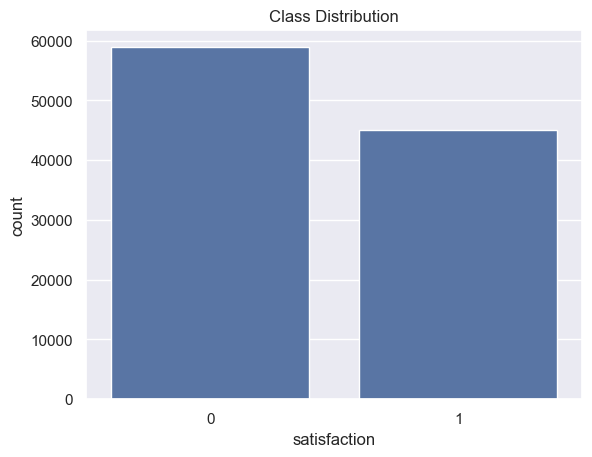

Class Ratio: 1.3076957245974459


In [254]:

class_counts = tempdf['satisfaction'].value_counts()
print("Class Counts:\n", class_counts)

sns.countplot(x='satisfaction', data=tempdf)
plt.title('Class Distribution')
plt.show()

majority_class_count = class_counts.max()
minority_class_count = class_counts.min()
class_ratio = majority_class_count / minority_class_count
print(f"Class Ratio: {class_ratio}")

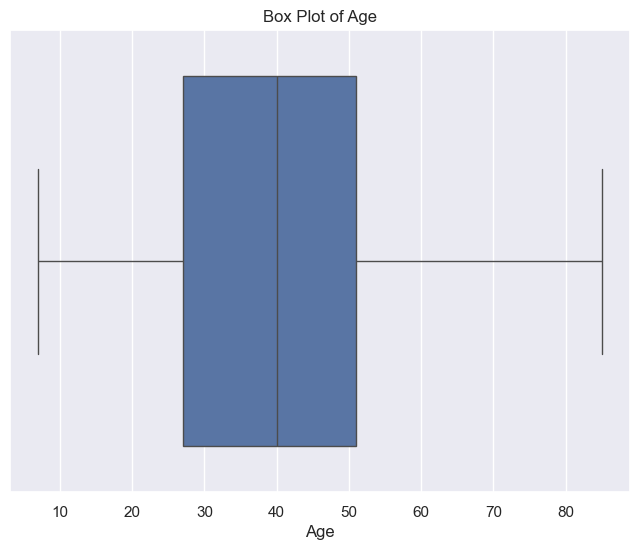

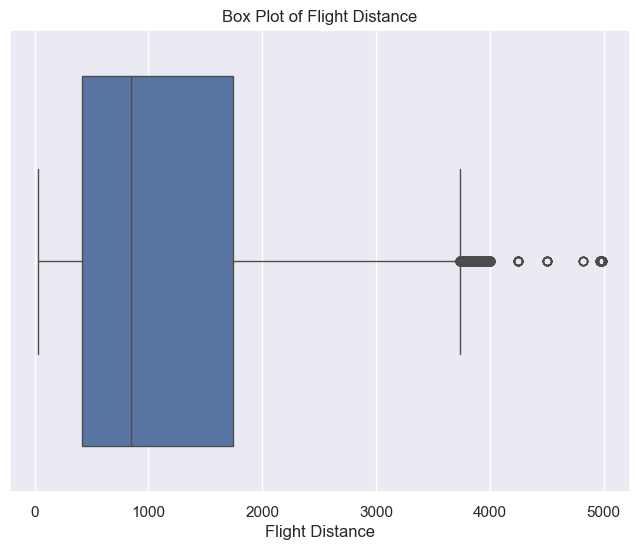

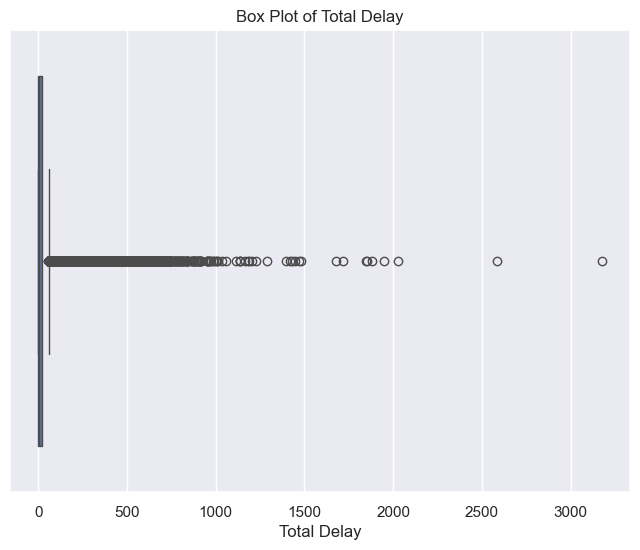

In [255]:

for col in numerical_variables:
  plt.figure(figsize=(8, 6))
  sns.boxplot(x=tempdf[col])
  plt.title(f'Box Plot of {col}')
  plt.show()

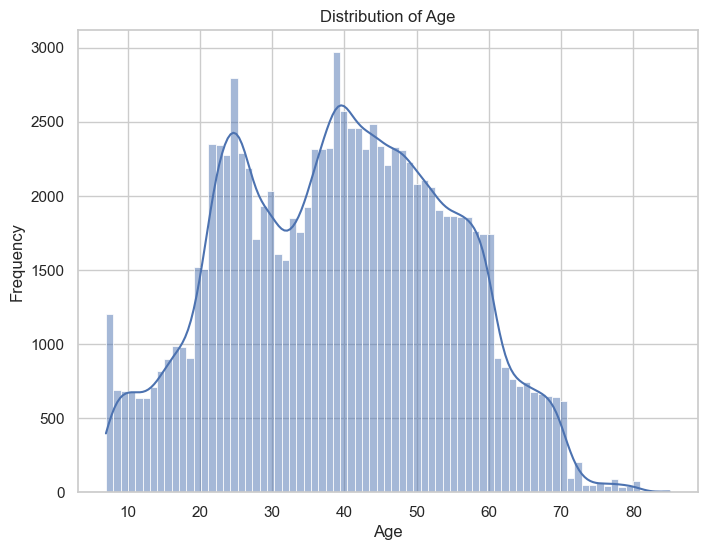

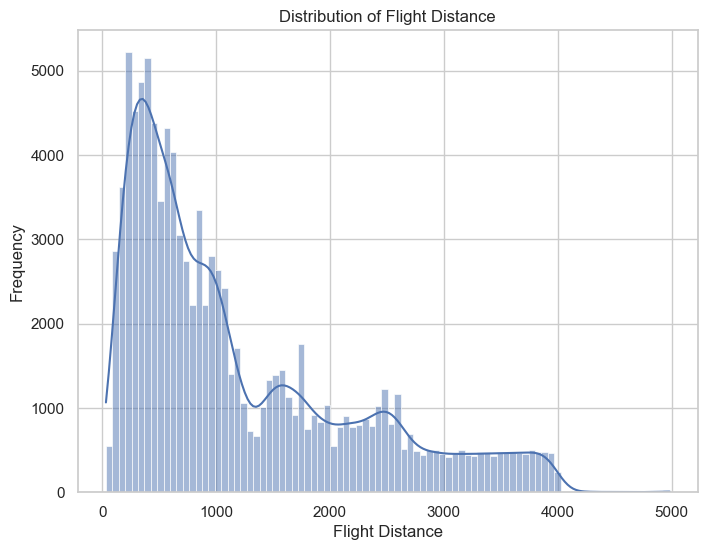

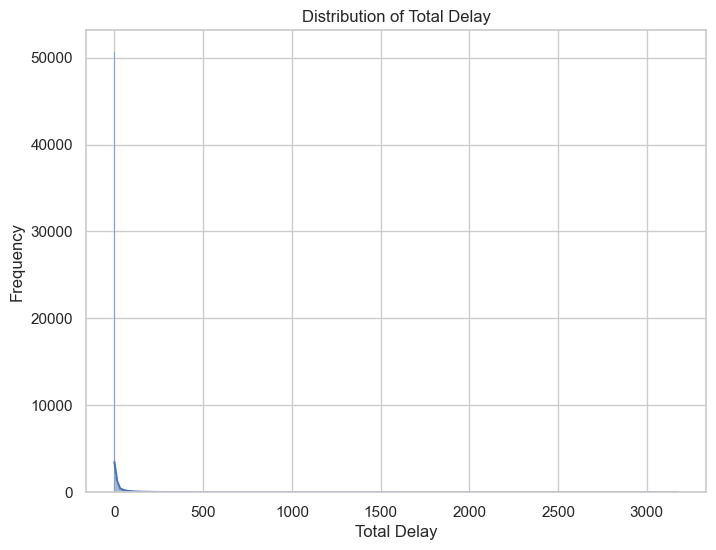

In [256]:
sns.set(style="whitegrid")

for col in ['Age', 'Flight Distance', 'Total Delay']:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=tempdf, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

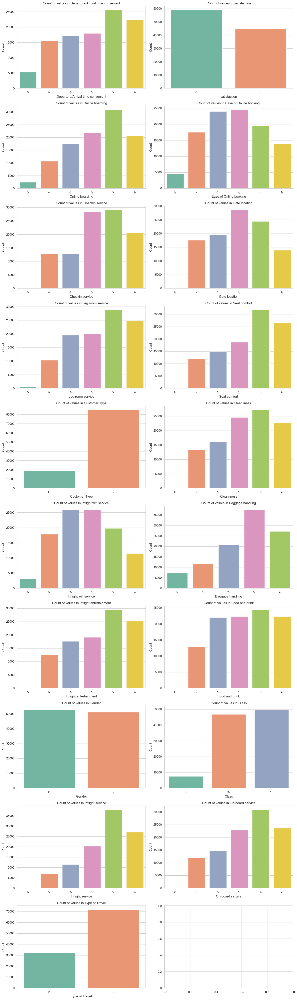

In [257]:
pretty_colors = sns.color_palette('Set2')

charts_per_row = 2

num_rows = int((len(categorical_variables) + charts_per_row - 1) / charts_per_row)

fig, axes = plt.subplots(num_rows, charts_per_row, figsize=(15, 5 * num_rows))

for i, column_name in enumerate(categorical_variables):
    tempdf[column_name] = tempdf[column_name].astype('object')

    row_index = i // charts_per_row
    col_index = i % charts_per_row

    sns.countplot(data=tempdf, x=column_name, ax=axes[row_index, col_index], palette=pretty_colors)

    axes[row_index, col_index].set_title(f'Count of values in {column_name}')

    axes[row_index, col_index].set_xlabel(column_name)

    axes[row_index, col_index].set_ylabel('Count')

    axes[row_index, col_index].tick_params(axis='x', rotation=45)

plt.tight_layout()

plt.show()

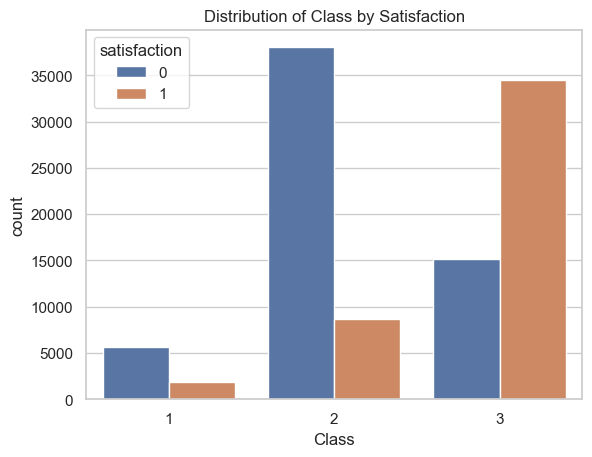

In [258]:
sns.countplot(x='Class', hue='satisfaction', data=tempdf)
plt.title('Distribution of Class by Satisfaction')
plt.show()

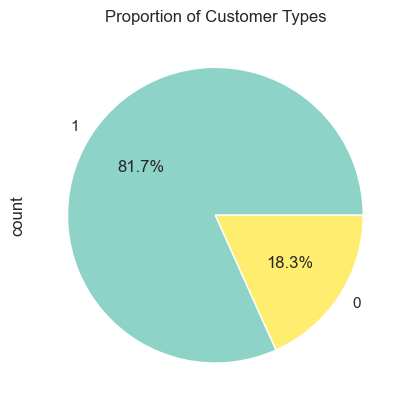

In [259]:
cmap = plt.cm.get_cmap('Set3')
tempdf['Customer Type'].value_counts().plot(kind='pie', autopct='%1.1f%%',cmap = cmap)
plt.title('Proportion of Customer Types')
plt.show()

<Figure size 1000x500 with 0 Axes>

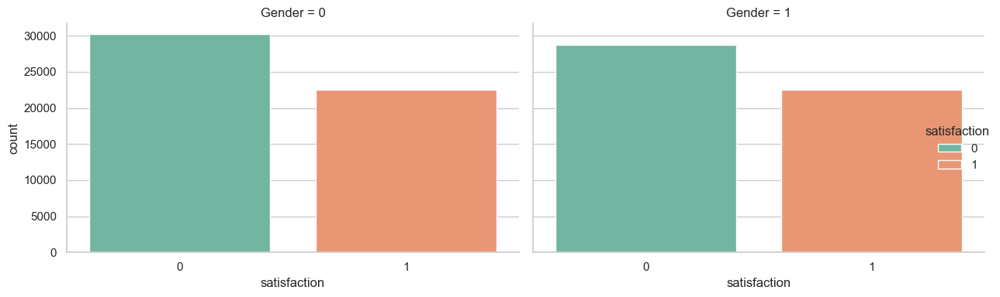

In [260]:
plt.figure(figsize=(10, 5))
plt.suptitle("Satisfaction by Gender")


sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction', col='Gender', kind='count', height=4, aspect=1.5, palette='Set2')

plt.tight_layout()
plt.show()

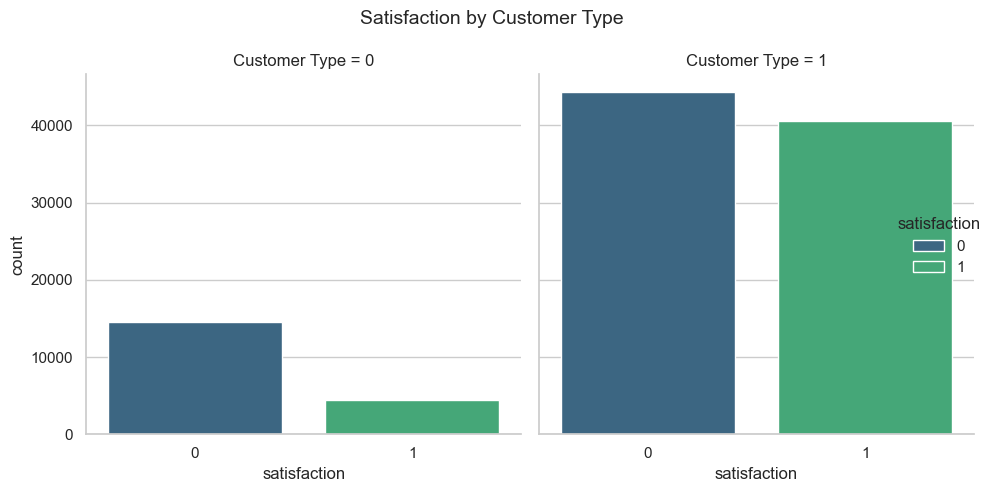

In [261]:
g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='Customer Type', kind='count', palette='viridis',
                order=tempdf['satisfaction'].unique())

g.fig.set_size_inches(10, 5)

g.fig.suptitle('Satisfaction by Customer Type', fontsize=14)

g.fig.tight_layout()

plt.show()

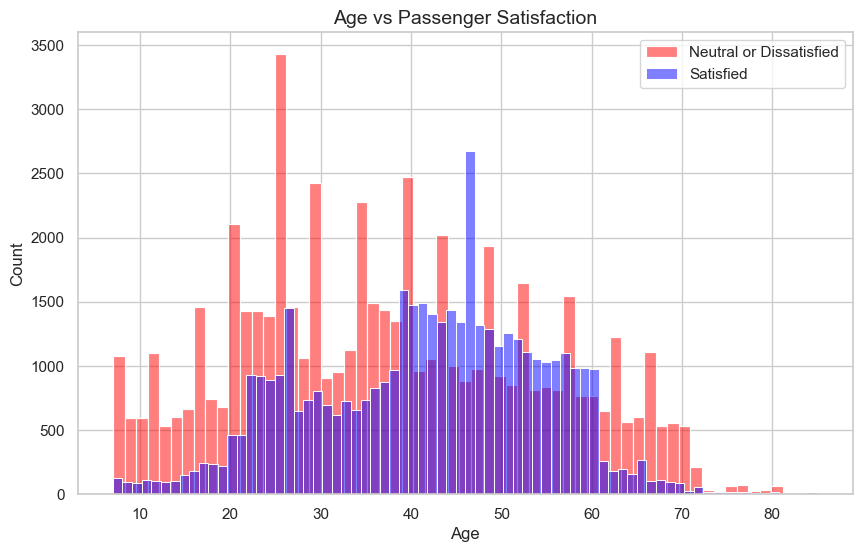

In [262]:
plt.figure(figsize=(10, 6))

sns.histplot(data=cleaned_data[cleaned_data['satisfaction'] == 'neutral or dissatisfied'], x='Age', color='red', alpha=0.5, label='Neutral or Dissatisfied')
sns.histplot(data=cleaned_data[cleaned_data['satisfaction'] == 'satisfied'], x='Age', color='blue', alpha=0.5, label='Satisfied')

plt.title('Age vs Passenger Satisfaction', fontsize=14)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend()
plt.show()

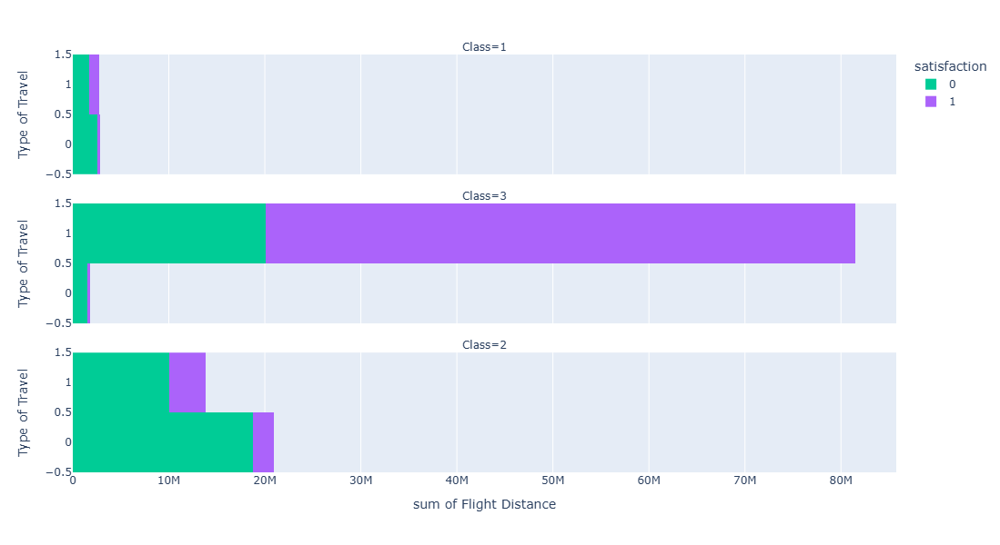

In [263]:
#satisfaction against class and type of travel
#######################################################################################################
fig = px.histogram(tempdf, x='Flight Distance', y='Type of Travel', color='satisfaction',
                   labels={'Flight Distance': 'Flight Distance', 'Type of Travel': 'Type of Travel'},
                   category_orders={'satisfaction': ['neutral or dissatisfied', 'satisfied']},
                   facet_col='Class',
                   facet_col_wrap=1)

fig.update_layout(height=600, width=800)

fig.show()

<Figure size 1200x500 with 0 Axes>

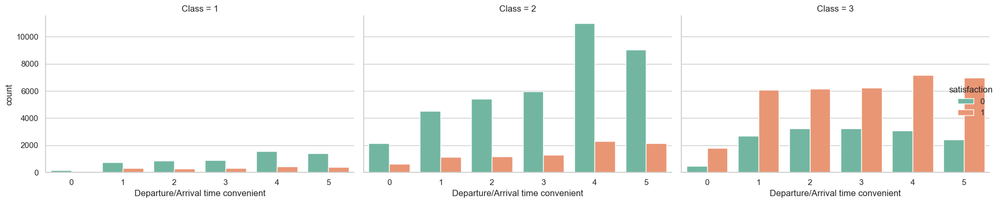

In [264]:
plt.figure(figsize=(12, 5))
plt.suptitle("Departure/Arrival Convenience with Online Boarding by Class")

g = sns.catplot(data=tempdf, x="Departure/Arrival time convenient", hue="satisfaction",
                col="Class", kind="count", height=4, aspect=1.5, palette="Set2")

plt.tight_layout()
plt.show()

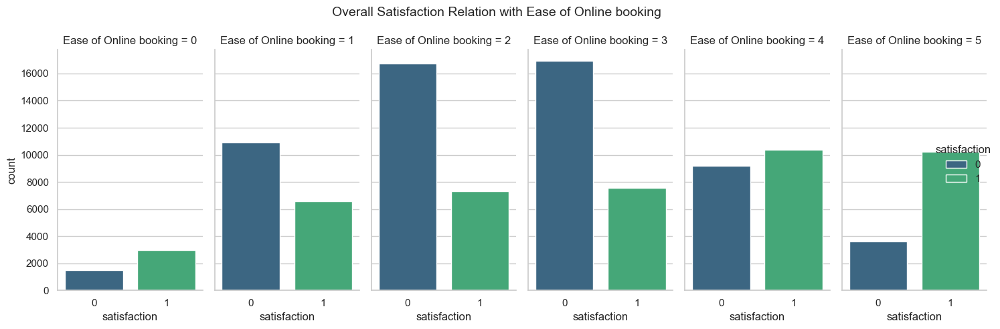

In [265]:
g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='Ease of Online booking', kind='count', palette='viridis',
                order=tempdf['satisfaction'].unique())

g.fig.set_size_inches(15, 5)

g.fig.suptitle('Overall Satisfaction Relation with Ease of Online booking', fontsize=14)

g.fig.tight_layout()

plt.show()

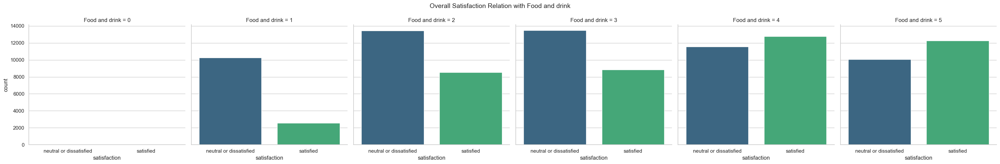

In [266]:
g = sns.catplot(data=cleaned_data, x='satisfaction', hue='satisfaction',
                col='Food and drink', kind='count', palette='viridis',
                order=cleaned_data['satisfaction'].unique())

g.fig.suptitle('Overall Satisfaction Relation with Food and drink', fontsize=14)
g.fig.tight_layout()

plt.show()

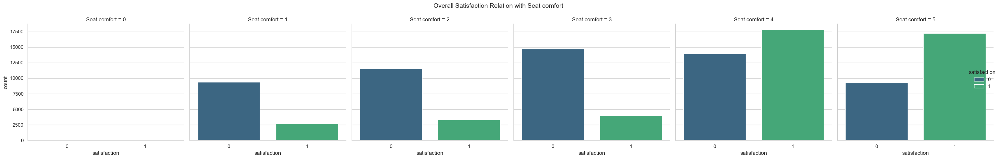

In [267]:

g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='Seat comfort', kind='count', palette='viridis',
                order=tempdf['satisfaction'].unique())

g.fig.suptitle('Overall Satisfaction Relation with Seat comfort', fontsize=14)

g.fig.tight_layout()

plt.show()


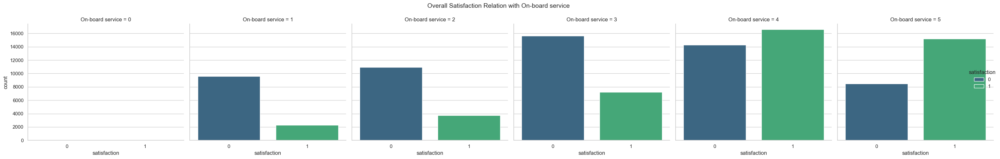

In [268]:



g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='On-board service', kind='count', palette='viridis',
                order=tempdf['satisfaction'].unique())

g.fig.suptitle('Overall Satisfaction Relation with On-board service', fontsize=14)

g.fig.tight_layout()

plt.show()


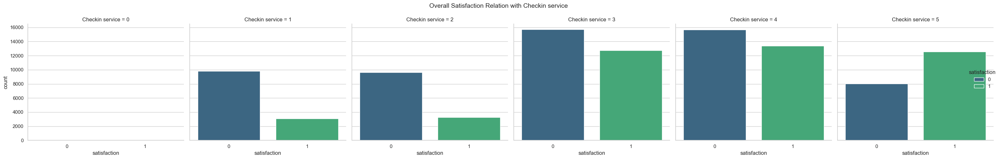

In [269]:

g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='Checkin service', kind='count', palette='viridis',
                order=tempdf['satisfaction'].unique())

g.fig.suptitle('Overall Satisfaction Relation with Checkin service', fontsize=14)

g.fig.tight_layout()

plt.show()

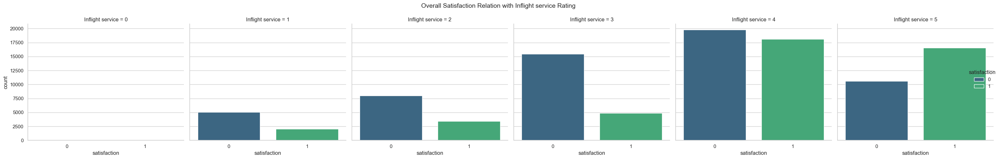

In [270]:

g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='Inflight service', kind='count', palette='viridis')

g.fig.suptitle('Overall Satisfaction Relation with Inflight service Rating', fontsize=14)

g.fig.tight_layout()

plt.show()

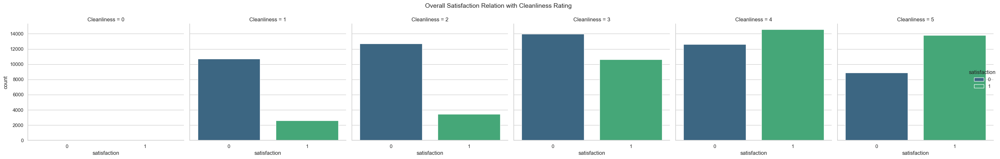

In [271]:

g = sns.catplot(data=tempdf, x='satisfaction', hue='satisfaction',
                col='Cleanliness', kind='count', palette='viridis')

g.fig.suptitle('Overall Satisfaction Relation with Cleanliness Rating', fontsize=14)

g.fig.tight_layout()

plt.show()

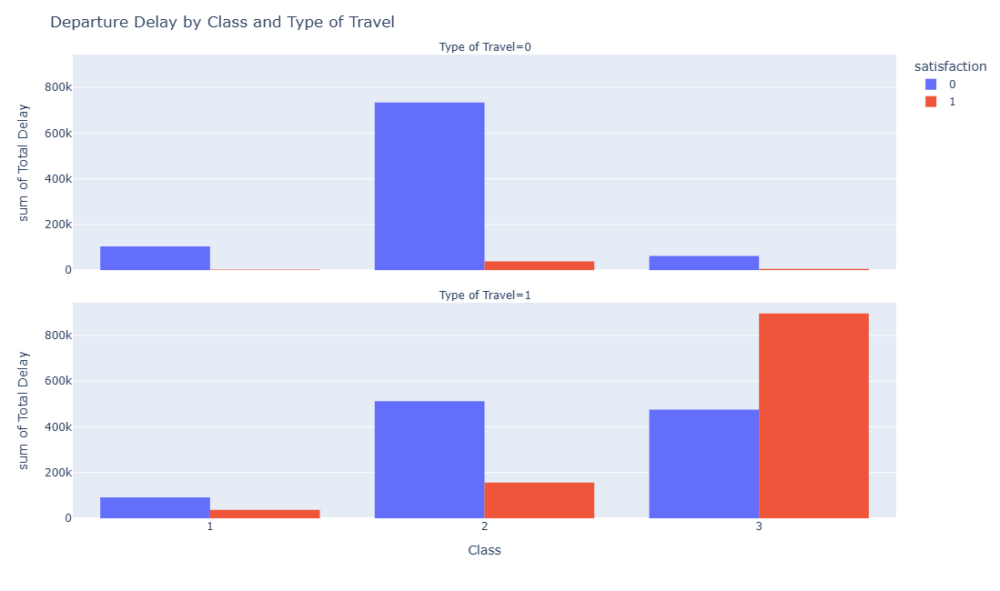

In [272]:
#Departure Delay by class and Type of travel with Overall Satisfaction
fig = px.histogram(tempdf, x="Class", y="Total Delay", color="satisfaction",
                   facet_col="Type of Travel", barmode="group", height=650,
                   facet_col_wrap=1, category_orders={"Class": ["Eco", "Eco Plus", "Business"]})

fig.update_layout(title="Departure Delay by Class and Type of Travel")
fig.show()

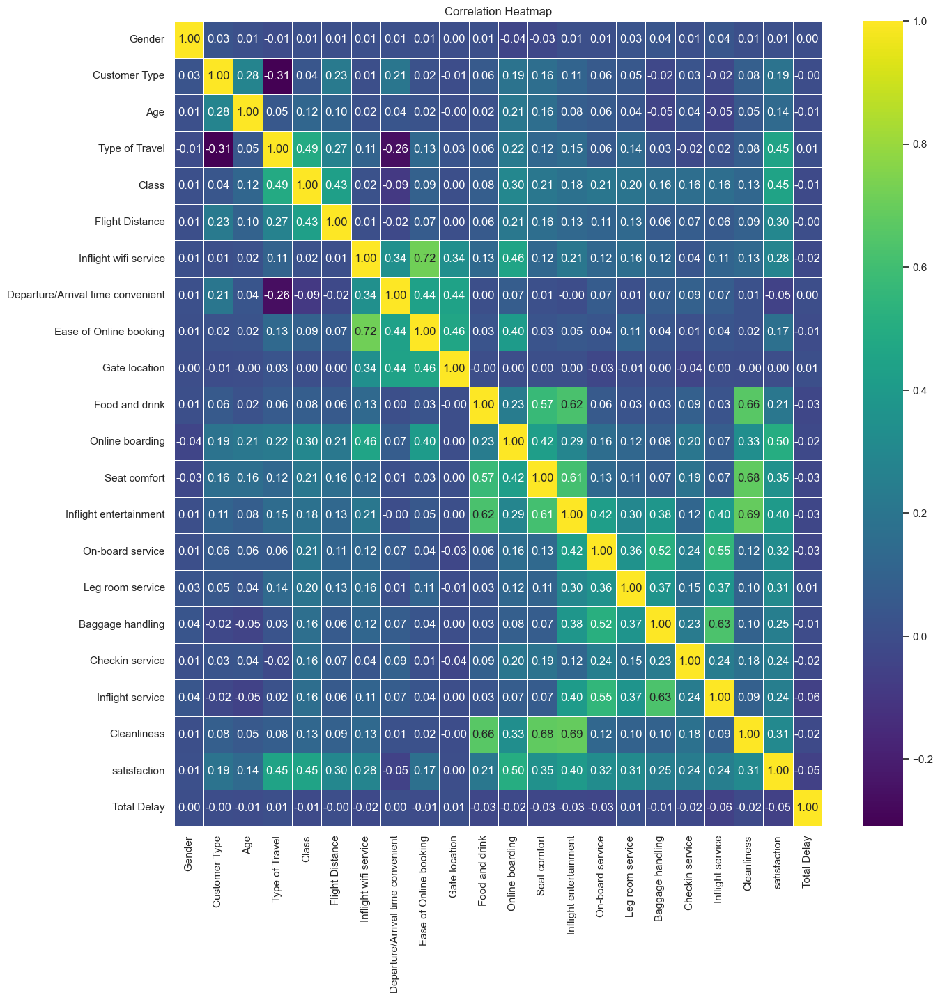

In [273]:
# Correlation heatmap
correlation_matrix = tempdf.corr()
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

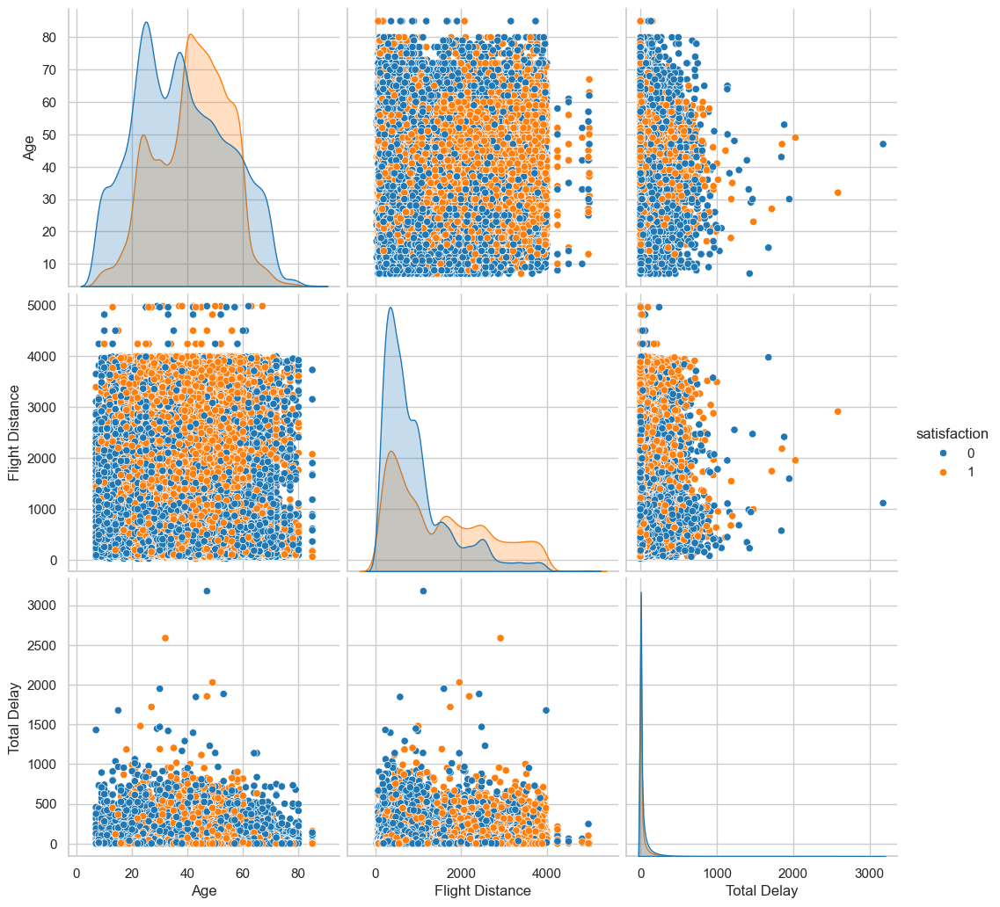

In [274]:
age_data = tempdf["Age"]
flight_distance_data = tempdf["Flight Distance"]
total_delay_data = tempdf["Total Delay"]
satisfaction_data = tempdf["satisfaction"]

temp_df = pd.DataFrame({
    "Age": age_data,
    "Flight Distance": flight_distance_data,
    "Total Delay": total_delay_data,
    "satisfaction": satisfaction_data
})

sns.pairplot(temp_df, hue="satisfaction", height=3.5, palette="tab10")
plt.show()


## Dealing with Outliers

In [276]:
data_mapped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

In [277]:
# prompt: deal ith numerical outliers



columns_to_scale = ['Age', 'Flight Distance', 'Total Delay']

# Apply Min-Max scaling
scaler = MinMaxScaler()
df_scaled = data_mapped.copy()
df_scaled[columns_to_scale] = scaler.fit_transform(df_scaled[columns_to_scale])

# Display the scaled dataframe
print("\nScaled DataFrame:")
df_scaled.head()


df_scaled.info()


Scaled DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  float64
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  float64
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding     

In [278]:

def treat_outliers_iqr(df, column):

  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
  df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])

  return df


# Apply the function to the numerical columns where you want to treat outliers.
for col in ['Age', 'Flight Distance', 'Total Delay']:
    df_scaled = treat_outliers_iqr(df_scaled, col)


In [279]:
df_scaled

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,satisfaction,Total Delay
0,1,1,0.076923,0,1,0.086632,3,4,3,1,...,5,5,4,3,4,4,5,5,0,0.013539
1,1,0,0.230769,1,3,0.041195,3,2,3,3,...,1,1,1,5,3,1,4,1,0,0.002204
2,0,1,0.243590,1,3,0.224354,2,2,2,2,...,5,5,4,3,4,4,4,5,1,0.000000
3,0,1,0.230769,1,3,0.107229,2,5,5,5,...,2,2,2,5,3,1,4,2,0,0.006297
4,1,1,0.692308,1,3,0.036955,3,3,3,3,...,5,3,3,4,4,3,3,3,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,0,0,0.205128,1,2,0.032512,2,1,2,3,...,2,2,3,1,4,2,3,2,0,0.000945
103900,1,1,0.538462,1,3,0.467690,4,4,4,4,...,5,5,5,5,5,5,5,4,1,0.000000
103901,1,0,0.294872,1,3,0.396607,1,1,1,3,...,5,4,3,2,4,5,5,4,0,0.006612
103902,0,0,0.192308,1,2,0.195679,1,1,1,5,...,1,1,4,5,1,5,4,1,0,0.000000


### Final Data into CSV

In [281]:
df_scaled.reset_index(drop=True, inplace=True)

In [282]:
df_scaled

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,satisfaction,Total Delay
0,1,1,0.076923,0,1,0.086632,3,4,3,1,...,5,5,4,3,4,4,5,5,0,0.013539
1,1,0,0.230769,1,3,0.041195,3,2,3,3,...,1,1,1,5,3,1,4,1,0,0.002204
2,0,1,0.243590,1,3,0.224354,2,2,2,2,...,5,5,4,3,4,4,4,5,1,0.000000
3,0,1,0.230769,1,3,0.107229,2,5,5,5,...,2,2,2,5,3,1,4,2,0,0.006297
4,1,1,0.692308,1,3,0.036955,3,3,3,3,...,5,3,3,4,4,3,3,3,1,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,0,0,0.205128,1,2,0.032512,2,1,2,3,...,2,2,3,1,4,2,3,2,0,0.000945
103900,1,1,0.538462,1,3,0.467690,4,4,4,4,...,5,5,5,5,5,5,5,4,1,0.000000
103901,1,0,0.294872,1,3,0.396607,1,1,1,3,...,5,4,3,2,4,5,5,4,0,0.006612
103902,0,0,0.192308,1,2,0.195679,1,1,1,5,...,1,1,4,5,1,5,4,1,0,0.000000


In [283]:
df_scaled.to_csv('new_filename.csv', index=False)
df_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  float64
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  float64
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

### Feature Engineering

In [285]:
data=pd.DataFrame({'Gender':df_scaled['Gender'],
                  'Customer Type':df_scaled['Customer Type'],
                  'Age':df_scaled['Age'],
                  'Type of Travel':df_scaled['Type of Travel'],
                  'Class':df_scaled['Class'],
                  'Flight Distance':df_scaled['Flight Distance'],
                   'Ease of Online booking':df_scaled['Ease of Online booking'],
                  'Departure/Arrival time convenient' : df_scaled['Departure/Arrival time convenient'],
                  'Total Delay':df_scaled['Total Delay']})

df = df_scaled
data["Total_Inflight_Satisfaction"] = df["Inflight service"] + df["Cleanliness"]+ df["Leg room service"]+ df["Inflight entertainment"]+ df["Seat comfort"]+ df["Inflight wifi service"]+ df["Food and drink"]
data["Total_Onboard_Satisfaction"] = df["Gate location"] + df["On-board service"]+ df["Online boarding"] + df["Baggage handling"] + df["Checkin service"]
data["satisfaction"] = df_scaled["satisfaction"]
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 12 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  float64
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  float64
 6   Ease of Online booking             103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Total Delay                        103904 non-null  float64
 9   Total_Inflight_Satisfaction        103904 non-null  int64  
 10  Total_Onboard_Satisfaction         103904 non-null  int64  
 11  satisfaction                       1039

In [286]:
test_df = pd.read_csv('test.csv' , index_col = 0)
test_df.drop('id' , axis = 1, inplace = True)

test_df['Total Delay'] = test_df['Arrival Delay in Minutes'] + test_df['Departure Delay in Minutes']
test_df.drop(columns = ['Arrival Delay in Minutes','Departure Delay in Minutes'],inplace = True)
test_df.dropna(inplace=True)

columns_to_scale = ['Age', 'Flight Distance', 'Total Delay']

scaler = MinMaxScaler()
test_df[columns_to_scale] = scaler.fit_transform(test_df[columns_to_scale])


test_df['satisfaction'] = test_df['satisfaction'].map(map1)
test_df['Customer Type'] = test_df['Customer Type'].map(map2)
test_df['Type of Travel'] = test_df['Type of Travel'].map(map3)
test_df['Class'] = test_df['Class'].map(map4)
test_df['Gender'] = test_df['Gender'].map(map5)


test_data=pd.DataFrame({'Gender':test_df['Gender'],
                  'Customer Type':test_df['Customer Type'],
                  'Age':test_df['Age'],
                  'Type of Travel':test_df['Type of Travel'],
                  'Class':test_df['Class'],
                  'Flight Distance':test_df['Flight Distance'],
                   'Ease of Online booking':test_df['Ease of Online booking'],
                  'Departure/Arrival time convenient' : test_df['Departure/Arrival time convenient'],
                  'Total Delay':test_df['Total Delay']})

df2 = test_df
test_data["Total_Inflight_Satisfaction"] = df2["Inflight service"] + df2["Cleanliness"]+ df2["Leg room service"]+ df2["Inflight entertainment"]+ df2["Seat comfort"]+ df2["Inflight wifi service"]+ df2["Food and drink"]
test_data["Total_Onboard_Satisfaction"] = df2["Gate location"] + df2["On-board service"]+ df2["Online boarding"] + df2["Baggage handling"] + df2["Checkin service"]
test_data["satisfaction"] = test_df["satisfaction"]
test_data.info()


<class 'pandas.core.frame.DataFrame'>
Index: 25893 entries, 0 to 25975
Data columns (total 12 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender                             25893 non-null  int64  
 1   Customer Type                      25893 non-null  int64  
 2   Age                                25893 non-null  float64
 3   Type of Travel                     25893 non-null  int64  
 4   Class                              25893 non-null  int64  
 5   Flight Distance                    25893 non-null  float64
 6   Ease of Online booking             25893 non-null  int64  
 7   Departure/Arrival time convenient  25893 non-null  int64  
 8   Total Delay                        25893 non-null  float64
 9   Total_Inflight_Satisfaction        25893 non-null  int64  
 10  Total_Onboard_Satisfaction         25893 non-null  int64  
 11  satisfaction                       25893 non-null  int64  


# Modeling

### Logistic Regression

In [289]:

x = data.drop(['satisfaction'],axis = 1)
y = data['satisfaction']
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.2,random_state = 45,stratify = y)

y_test_df = test_data['satisfaction']
x_test_df = test_data.drop(['satisfaction'], axis=1)

In [290]:
log_reg = LogisticRegression()
log_reg.fit(x_train,y_train)


LogisticRegression()

In [291]:
yhat1_log=log_reg.predict(x_test)
yhat2_log=log_reg.predict(x_test_df)

In [292]:

def ModelStats(y_test,y_hat):
    print('Accuracy score of testing set', round(accuracy_score(y_test, y_hat),3), '\n')
    print('Precision score of testing set', round(precision_score(y_test, y_hat,average="weighted"),3), '\n')
    print('Recall score of testing set', round(recall_score(y_test, y_hat,average="weighted"),3), '\n')
    print('F1 score of testing set', round(f1_score(y_test, y_hat,average="weighted"),3), '\n')
    cm = confusion_matrix(y_test,y_hat)
    sns.heatmap(cm, annot=True, square=True, fmt='1', cmap = 'BuGn')
    plt.show()

LOGISTIC REGRESSION MODEL RESULTS 
Accuracy score of testing set 0.859 

Precision score of testing set 0.858 

Recall score of testing set 0.859 

F1 score of testing set 0.858 



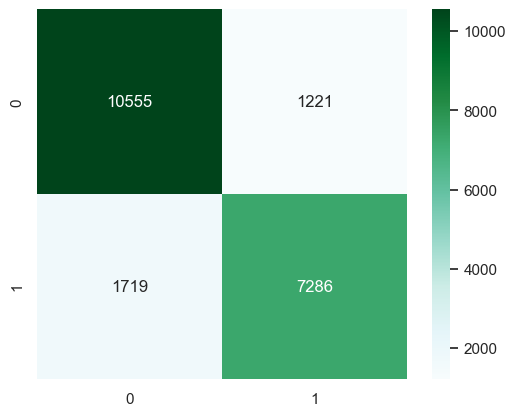

In [293]:
print("LOGISTIC REGRESSION MODEL RESULTS ")
ModelStats(y_test,yhat1_log)

LOGISTIC REGRESSION MODEL RESULTS ON TEST FILE
Accuracy score of testing set 0.854 

Precision score of testing set 0.854 

Recall score of testing set 0.854 

F1 score of testing set 0.854 



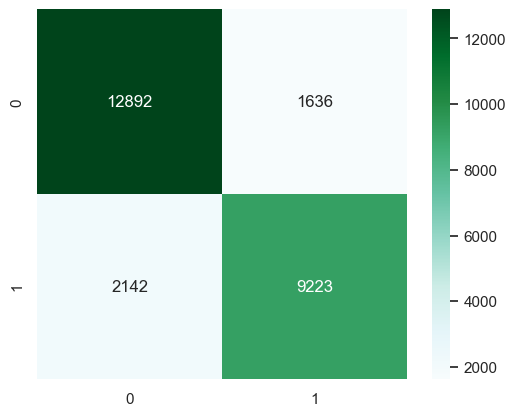

In [294]:
print("LOGISTIC REGRESSION MODEL RESULTS ON TEST FILE")
ModelStats(y_test_df,yhat2_log)

## Random Forest Algorithm


In [296]:
ran = RandomForestClassifier()
ran.fit(x_train,y_train)
yhat1_ran=ran.predict(x_test)
yhat2_ran=ran.predict(x_test_df)


RANDOM FOREST MODEL RESULT
Accuracy score of testing set 0.904 

Precision score of testing set 0.904 

Recall score of testing set 0.904 

F1 score of testing set 0.904 



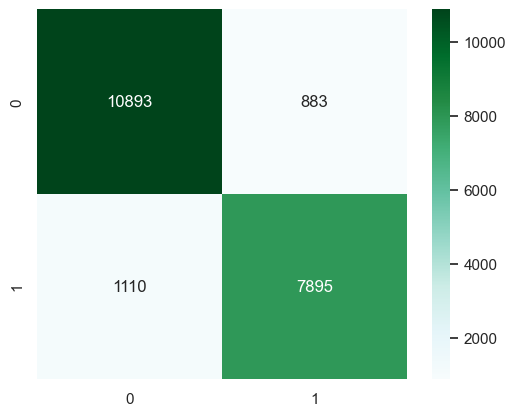

In [297]:
print("RANDOM FOREST MODEL RESULT")
ModelStats(y_test,yhat1_ran)

RANDOM FOREST MODEL RESULTS FOR TEST FILE
Accuracy score of testing set 0.911 

Precision score of testing set 0.911 

Recall score of testing set 0.911 

F1 score of testing set 0.911 



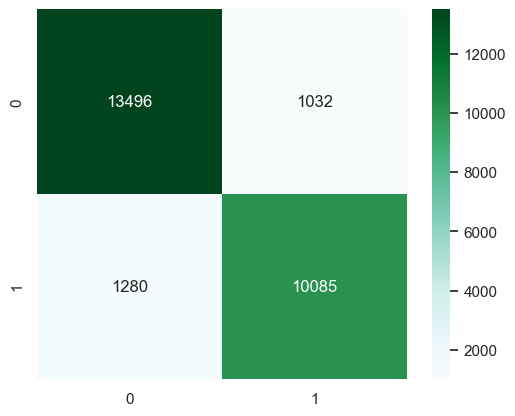

In [298]:
print("RANDOM FOREST MODEL RESULTS FOR TEST FILE")
ModelStats(y_test_df,yhat2_ran)

## K Nearest Neighbour Algorithm

In [300]:

knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
yhat1_knn=knn.predict(x_test)
yhat2_knn=knn.predict(x_test_df)


 KNN MODEL RESULTS 
Accuracy score of testing set 0.881 

Precision score of testing set 0.881 

Recall score of testing set 0.881 

F1 score of testing set 0.881 



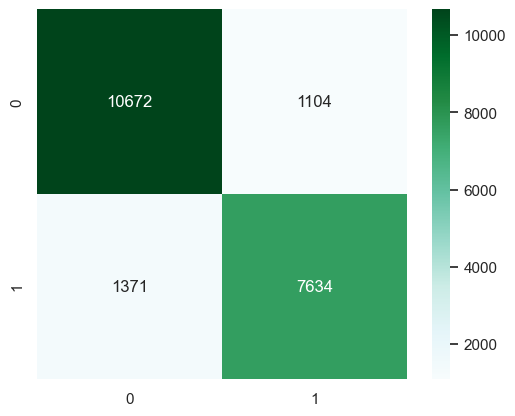

In [301]:
print(" KNN MODEL RESULTS ")
ModelStats(y_test,yhat1_knn)

 KNN MODEL RESULTS FOR TEST FILE
Accuracy score of testing set 0.882 

Precision score of testing set 0.882 

Recall score of testing set 0.882 

F1 score of testing set 0.882 



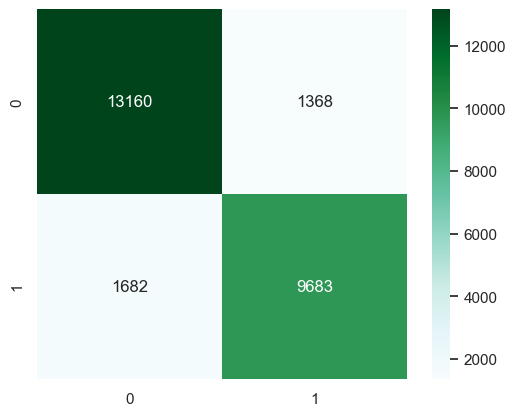

In [302]:
print(" KNN MODEL RESULTS FOR TEST FILE")
ModelStats(y_test_df,yhat2_knn)

### Checking Test Scores

In [369]:
print("********Score for Logistic Regression**********")
print("Training data score : ", round(log_reg.score(x_train, y_train), 4))
print("Testing data score : ", round(log_reg.score(x_test, y_test), 4))
print("Testing File data score : ", round(log_reg.score(x_test_df, y_test_df), 4))
print("\n")

print("********Score for Random Forest**********")
print("Training data score : ", round(ran.score(x_train, y_train), 4))
print("Testing data score : ", round(ran.score(x_test, y_test), 4))
print("Testing File data score : ", round(ran.score(x_test_df, y_test_df), 4))
print("\n")

print("********Score for KNN**********")
print("Training data score : ", round(knn.score(x_train, y_train), 4))
print("Testing data score : ", round(knn.score(x_test, y_test), 4))
print("Testing File data score : ", round(knn.score(x_test_df, y_test_df), 4))
print("\n")


********Score for Logistic Regression**********
Training data score :  0.8611
Testing data score :  0.8585
Testing File data score :  0.8541


********Score for Random Forest**********
Training data score :  1.0
Testing data score :  0.9041
Testing File data score :  0.9107


********Score for KNN**********
Training data score :  0.9162
Testing data score :  0.8809
Testing File data score :  0.8822




## Model Evaluation 


def EvaluateModel(Model,x,y):
    stats = []
    stats.append(round(accuracy_score(x,y),3))
    stats.append(round(precision_score(x,y,average="weighted"),3))
    stats.append(round(recall_score(x,y,average="weighted"),3))
    stats.append(round(f1_score(x,y,average="weighted"),3))
    stats.append(Model.score(x,y))
    return stats


eval_df = pd.DataFrame(columns = ['Model','Accuracy','Precision','Recall','F1_Score','Model_Score'])
eval_test_df = pd.DataFrame(columns = ['Model','Accuracy','Precision','Recall','F1_Score','Model_Score'])

#Model_Names = ['Logistic Regression','Random Forest','K Neighbours ']

#eval_df['Model'] = Model_Names
#eval_test_df['Model'] = Model_Names

eval_df.loc[len(eval_df)] = ['Logistic Regression'] + EvaluateModel(log_reg,y_test,yhat1_log)
eval_df.loc[len(eval_test_df)] = ['Logistic Regression'] + EvaluateModel(log_reg,y_test_df,yhat2_log)

eval_df.loc[len(eval_df)] = ['Random Forest'] + EvaluateModel(ran,y_test,yhat1_ran)
eval_df.loc[len(eval_test_df)] = ['Random Forest'] + EvaluateModel(ran,y_test_df,yhat2_ran)

eval_df.loc[len(eval_df)] = ['K Neighbours'] + EvaluateModel(knn,y_test,yhat1_knn)
eval_df.loc[len(eval_test_df)] = ['K Neighbours'] + EvaluateModel(knn,y_test_df,yhat2_knn)

In [344]:
Model_Names = ['Logistic Regression','Random Forest','K Neighbours ']


In [345]:
acc=[]
test_acc=[]
acc.append(round(accuracy_score(y_test,yhat1_log),3))
test_acc.append(round(accuracy_score(y_test_df,yhat2_log),3))

acc.append(round(accuracy_score(y_test,yhat1_ran),3))
test_acc.append(round(accuracy_score(y_test_df,yhat2_ran),3))

acc.append(round(accuracy_score(y_test,yhat1_knn),3))
test_acc.append(round(accuracy_score(y_test_df,yhat2_knn),3))

In [346]:
pre=[]
test_pre=[]

pre.append(round(precision_score(y_test,yhat1_log,average="weighted"),3))
test_pre.append(round(precision_score(y_test_df,yhat2_log,average="weighted"),3))

pre.append(round(precision_score(y_test,yhat1_ran,average="weighted"),3))
test_pre.append(round(precision_score(y_test_df,yhat2_ran,average="weighted"),3))

pre.append(round(precision_score(y_test,yhat1_knn,average="weighted"),3))
test_pre.append(round(precision_score(y_test_df,yhat2_knn,average="weighted"),3))

In [347]:
rec=[]
test_rec=[]

rec.append(round(recall_score(y_test,yhat1_log,average="weighted"),3))
test_rec.append(round(recall_score(y_test_df,yhat2_log,average="weighted"),3))

rec.append(round(recall_score(y_test,yhat1_ran,average="weighted"),3))
test_rec.append(round(recall_score(y_test_df,yhat2_ran,average="weighted"),3))

rec.append(round(recall_score(y_test,yhat1_knn,average="weighted"),3))
test_rec.append(round(recall_score(y_test_df,yhat2_knn,average="weighted"),3))

In [348]:
f1=[]
test_f1=[]

f1.append(round(f1_score(y_test,yhat1_log,average="weighted"),3))
test_f1.append(round(f1_score(y_test_df,yhat2_log,average="weighted"),3)) 

f1.append(round(f1_score(y_test,yhat1_ran,average="weighted"),3))
test_f1.append(round(f1_score(y_test_df,yhat2_ran,average="weighted"),3)) 

f1.append(round(f1_score(y_test,yhat1_knn,average="weighted"),3))
test_f1.append(round(f1_score(y_test_df,yhat2_knn,average="weighted"),3))

In [349]:
model_score=[]
test_model_score=[]

model_score.append(round(log_reg.score(x_test,y_test),3))
test_model_score.append(round(log_reg.score(x_test_df,y_test_df),3))

model_score.append(round(ran.score(x_test,y_test),3))
test_model_score.append(round(ran.score(x_test_df,y_test_df),3))

model_score.append(round(knn.score(x_test,y_test),3))
test_model_score.append(round(knn.score(x_test_df,y_test_df),3))

In [350]:
eval_df['Model']=Model_Names
eval_test_df['Model']=Model_Names

eval_df['Accuracy']=acc
eval_test_df['Accuracy']=test_acc

eval_df['Precision']=pre
eval_test_df['Precision']=test_pre

eval_df['Recall']=rec
eval_test_df['Recall']=test_rec

eval_df['F1_Score']=f1
eval_test_df['F1_Score']=test_f1

eval_df['Model_Score']=model_score
eval_test_df['Model_Score']=test_model_score

In [351]:
eval_df.index = range(1, len(eval_df) + 1)
eval_test_df.index = range(1, len(eval_test_df) + 1)


In [352]:
eval_df

,Model,Accuracy,Precision,Recall,F1_Score,Model_Score
1,Logistic Regression,0.859,0.858,0.859,0.858,0.859
2,Random Forest,0.904,0.904,0.904,0.904,0.904
3,K Neighbours,0.881,0.881,0.881,0.881,0.881


In [353]:
eval_test_df

,Model,Accuracy,Precision,Recall,F1_Score,Model_Score
1,Logistic Regression,0.854,0.854,0.854,0.854,0.854
2,Random Forest,0.911,0.911,0.911,0.911,0.911
3,K Neighbours,0.882,0.882,0.882,0.882,0.882


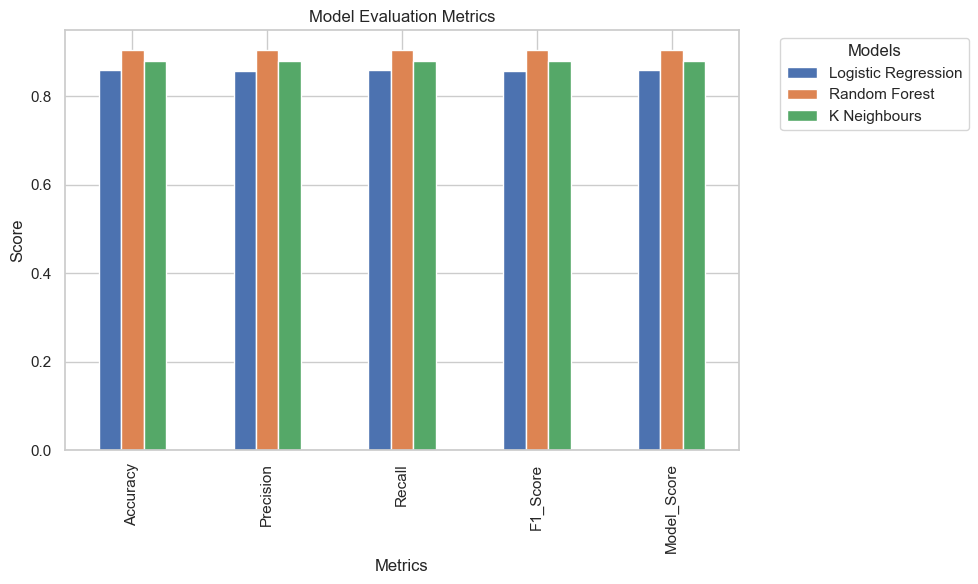

In [371]:
df_transposed = eval_df.set_index('Model').T

# Plot metrics for each model
df_transposed.plot(kind='bar', figsize=(10, 6), title="Model Evaluation Metrics")
plt.ylabel("Score")
plt.xlabel("Metrics")
plt.legend(title="Models", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

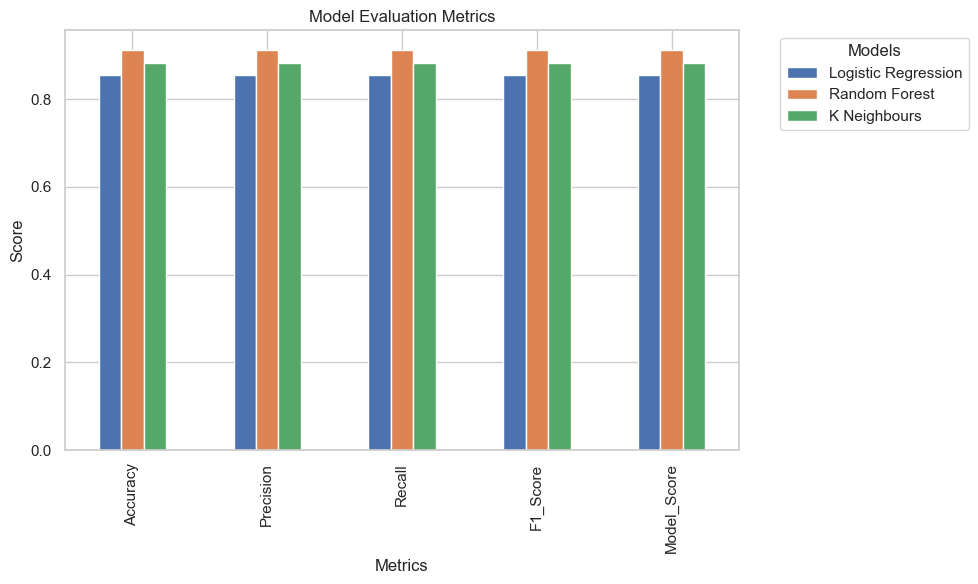

In [391]:
df_transposed = eval_test_df.set_index('Model').T

# Plot metrics for each model
df_transposed.plot(kind='bar', figsize=(10, 6), title="Model Evaluation Metrics")
plt.ylabel("Score")
plt.xlabel("Metrics")
plt.legend(title="Models", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

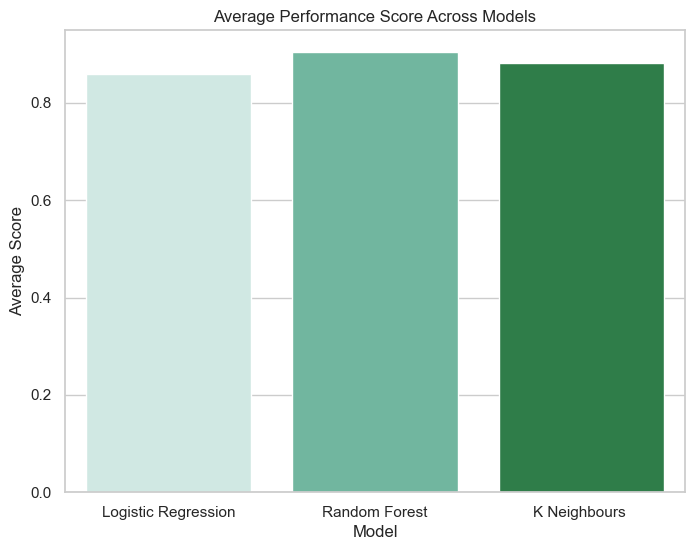

In [399]:
# Add Average_Score to the DataFrame if not already calculated
eval_df['Average_Score'] = eval_df[['Accuracy', 'Precision', 'Recall', 'F1_Score', 'Model_Score']].mean(axis=1)

# Plot the average score for each model
plt.figure(figsize=(8, 6))
sns.barplot(data=eval_df, x='Model', y='Average_Score', palette='BuGn')
plt.title("Average Performance Score Across Models")
plt.ylabel("Average Score")
plt.xlabel("Model")
plt.show()


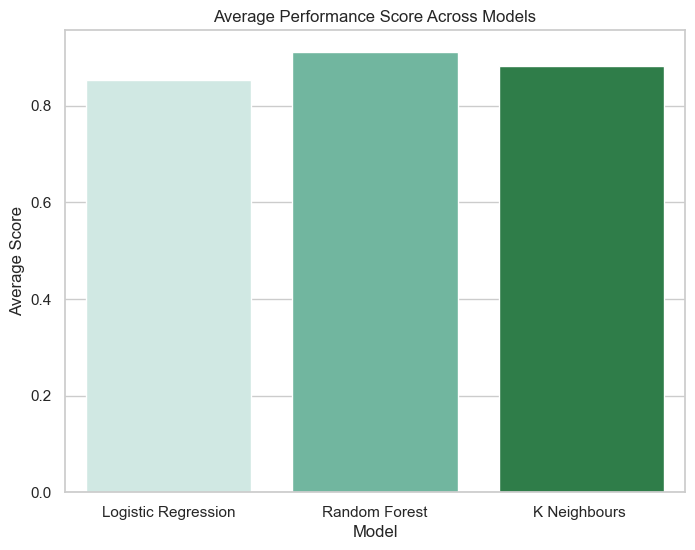

In [405]:
# Add Average_Score to the DataFrame if not already calculated
eval_test_df['Average_Score'] = eval_test_df[['Accuracy', 'Precision', 'Recall', 'F1_Score', 'Model_Score']].mean(axis=1)

# Plot the average score for each model
plt.figure(figsize=(8, 6))
sns.barplot(data=eval_test_df, x='Model', y='Average_Score', palette='BuGn')
plt.title("Average Performance Score Across Models")
plt.ylabel("Average Score")
plt.xlabel("Model")
plt.show()


In [423]:
# Calculate the average score for each model
eval_df['Average_Score'] = eval_df[['Accuracy', 'Precision', 'Recall', 'F1_Score', 'Model_Score']].mean(axis=1)

# Rank models based on the average score
ranked_models = eval_df.sort_values(by='Average_Score', ascending=False)
print("Ranked Models by Average Score:")
print(ranked_models[['Model', 'Average_Score']])


Ranked Models by Average Score:
                 Model  Average_Score
2        Random Forest         0.9040
3        K Neighbours          0.8810
1  Logistic Regression         0.8586


In [425]:
# Identify the best model for each metric
best_models = eval_df.set_index('Model').idxmax(axis=0)

print("Best Model for Each Metric:")
print(best_models)


Best Model for Each Metric:
Accuracy         Random Forest
Precision        Random Forest
Recall           Random Forest
F1_Score         Random Forest
Model_Score      Random Forest
Average_Score    Random Forest
Model_Color      Random Forest
dtype: object


In [427]:
# So Random Forest is our best model

In [1]:
pip install fastapi uvicorn requests

   ---------------------------------------- 0.0/94.8 kB ? eta -:--:--
   ----------------- ---------------------- 41.0/94.8 kB 2.0 MB/s eta 0:00:01
   ------------------------- -------------- 61.4/94.8 kB 656.4 kB/s eta 0:00:01
   ---------------------------------------- 94.8/94.8 kB 676.8 kB/s eta 0:00:00
   ---------------------------------------- 0.0/62.3 kB ? eta -:--:--
   ---------------------------------------  61.4/62.3 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 62.3/62.3 kB 1.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/73.2 kB ? eta -:--:--
   ---------------------------------------- 73.2/73.2 kB 1.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
from fastapi import FastAPI

In [7]:
app = FastAPI()
polygon_api_key = "ATTY8TP6JZ2U3FFP4WU417PSIIBZ5B47M1"

In [13]:
app.get("/transactions/{address}")
def get_transactions(address: str):
    url = f"https://api.polygonscan.com/api?module=account&action=txlist&address={address}&apikey={POLYGON_API_KEY}"
    response = requests.get(url)
    return response.json()

# Route to get MATIC balance of an address
app.get("/balance/{address}")
def get_balance(address: str):
    url = f"https://api.polygonscan.com/api?module=account&action=balance&address={address}&apikey={POLYGON_API_KEY}"
    response = requests.get(url)
    balance = int(response.json().get("result", 0)) / 10**18  # Convert wei to MATIC
    return {"address": address, "balance": balance}

In [17]:
conda activate your_environment_name
pip install uvicorn

SyntaxError: invalid syntax (1486598416.py, line 1)